# Machine Learning Models using Vehicle Specs data
**Created by:** [Ryan Parker](https://github.com/rparkr)

**Updated on:** 13-Nov-2021

---

## Description
In this notebook, I demonstrate three Machine Learning models using vehicle specs data obtained from CarAndDriver.com. 

1. **Multiple Linear Regression (MLR):** A prediction model for the numeric variable `Price` based on other numeric features (including dummy-coded categorical features) from the dataset.
2. **Decision Tree Classifier:** A prediction model for categorical variables. I chose to predict two variables: `Origin` (a two-class type of either _foreign_ or _domestic_) and `Body_style` (multi-class with 8 possible values).
3. **Clustering:** An unsupervised model for determining groups, or categories, in the data. Since this data has mixed types (numeric, text, Boolean) on mixed scales, a [_hierarchal agglomerative_ clustering model](https://scikit-learn.org/stable/tutorial/statistical_inference/unsupervised_learning.html#hierarchical-agglomerative-clustering-ward) would work best.


## Data source
* [vehicle_specs.csv](https://raw.githubusercontent.com/rparkr/ML-practice/main/Vehicle%20specs/vehicle_specs.csv), a file I generated from my [Data_Collection_Vehicle_Info.ipynb](https://github.com/rparkr/ML-practice/blob/main/Vehicle%20specs/Data_Collection_Vehicle_Info.ipynb) notebook, with data primarily from CarAndDriver.com

# Data cleaning
Preparing the dataset to be used for machine learning models

Install packages for data analysis and machine learning.

In [1]:
import pandas as pd                 # store and analyze tabular data
import numpy as np                  # various numerical functions
import matplotlib.pyplot as plt     # visualize data
import seaborn as sns               # visualize statistical data


Load the dataset into a `pandas` `DataFrame`.

In [2]:
df_orig = pd.read_csv('https://raw.githubusercontent.com/rparkr/ML-practice/main/Vehicle%20specs/vehicle_specs.csv', encoding='latin-1')

# Preview the DataFrame
print('Rows:\t', df_orig.shape[0], '\nCols:\t', df_orig.shape[1], '\n\n', sep='')
df_orig.head()

Rows:	3358
Cols:	47




,Trim_ID,Make,Model,Year,Style,Trim,Body_style,EPA_class,Pct_domestic_content,Origin,URL,Image,Price,Drivetrain,Engine,Engine_size_liters,Engine_size_inches,Max_horsepower,RPM_max_hp,Max_torque,RPM_max_torque,Transmission_type,Transmission_gears,CO2_emmissions,MPG_city,MPG_highway,MPG_combined,Fuel_capacity_gallons,Range_combined,Range_city,Range_highway,Wheelbase_inches,Length_inches,Width_inches,Height_inches,Ground_clearance_inches,Turning_diameter_ft,Front_wheel_size_inches,Rear_wheel_size_inches,Same_size_wheels,Seating_capacity,Cabin_volume_cubic_ft,Cargo_space_cubic_ft,GVWR_pounds,Curb_weight_pounds,Payload_capacity_pounds,Towing_capacity_pounds
0,419574,Acura,MDX,2022,Acura MDX,MDX SH-AWD w/Technology Package,suv,Small SUV 4WD,0.64,domestic,https://www.caranddriver.com/acura/mdx/specs/2...,https://hips.hearstapps.com/amv-prod-cad-asset...,54945.0,All Wheel Drive,Premium Unleaded V-6,3.5,212.0,290.0,6200.0,267.0,4700.0,Automatic w/OD,10.0,8.4,19.0,25.0,21.0,18.5,388.5,351.5,462.5,113.8,198.4,78.7,67.1,NaN,40.5,20 X 9,20 X 9,True,7,139.1,95.0,NaN,4529.0,NaN,5000.0
1,419576,Acura,MDX,2022,Acura MDX,MDX SH-AWD w/Advance Package,suv,Small SUV 4WD,0.64,domestic,https://www.caranddriver.com/acura/mdx/specs/2...,https://hips.hearstapps.com/amv-prod-cad-asset...,61995.0,All Wheel Drive,Premium Unleaded V-6,3.5,212.0,290.0,6200.0,267.0,4700.0,Automatic w/OD,10.0,8.4,19.0,25.0,21.0,18.5,388.5,351.5,462.5,113.8,198.4,78.7,67.1,NaN,40.5,20 X 9,20 X 9,True,7,139.1,95.0,NaN,4565.0,NaN,5000.0
2,419573,Acura,MDX,2022,Acura MDX,MDX SH-AWD,suv,Small SUV 4WD,0.64,domestic,https://www.caranddriver.com/acura/mdx/specs/2...,https://hips.hearstapps.com/amv-prod-cad-asset...,50245.0,All Wheel Drive,Premium Unleaded V-6,3.5,212.0,290.0,6200.0,267.0,4700.0,Automatic w/OD,10.0,8.4,19.0,25.0,21.0,18.5,388.5,351.5,462.5,113.8,198.4,78.7,67.1,NaN,40.5,19 X 8.5,19 X 8.5,True,7,139.1,95.0,NaN,4503.0,NaN,5000.0
3,419575,Acura,MDX,2022,Acura MDX,MDX SH-AWD w/A-Spec Package,suv,Small SUV 4WD,0.64,domestic,https://www.caranddriver.com/acura/mdx/specs/2...,https://hips.hearstapps.com/amv-prod-cad-asset...,58445.0,All Wheel Drive,Premium Unleaded V-6,3.5,212.0,290.0,6200.0,267.0,4700.0,Automatic w/OD,10.0,8.4,19.0,25.0,21.0,18.5,388.5,351.5,462.5,113.8,198.4,78.7,67.1,NaN,40.5,20 X 9,20 X 9,True,7,139.1,95.0,NaN,4534.0,NaN,5000.0
4,419577,Acura,MDX,2022,Acura MDX,MDX FWD,suv,Small SUV 2WD,0.64,domestic,https://www.caranddriver.com/acura/mdx/specs/2...,https://hips.hearstapps.com/amv-prod-cad-asset...,48245.0,Front Wheel Drive,Premium Unleaded V-6,3.5,212.0,290.0,6200.0,267.0,4700.0,Automatic w/OD,10.0,8.0,19.0,26.0,22.0,18.5,407.0,351.5,481.0,113.8,198.4,78.7,67.1,NaN,40.5,19 X 8.5,19 X 8.5,True,7,139.1,95.0,NaN,4271.0,NaN,3500.0


## Combine values for similar categories
Some of the categorical columns have distinct values that are really the same (e.g., "station-wagon" and "station wagon"). Here, we'll combine them so they become the same.

---

For columns with relatively few categories, show the value distribution to determine which values need to be combined.

In [3]:
threshold = 20
for col in df_orig:
    if len(df_orig[col].unique()) > threshold:
           continue # skip this column
    print('Column:\t', col, '\n', df_orig[col].value_counts(), '\n\n', sep='')

Column:	Year
2022    1331
2021    1125
2019     137
2020     125
2016      79
2017      78
2013      70
2014      67
2011      63
2018      61
2009      57
2012      54
2015      46
2010      37
2008      28
Name: Year, dtype: int64


Column:	Body_style
suv              1094
sedan             629
pickup            614
van               312
coupe             271
hatchback         175
convertible       166
station wagon      53
station-wagon      23
targa               3
Name: Body_style, dtype: int64


Column:	Origin
foreign     2563
domestic     744
unknown       51
Name: Origin, dtype: int64


Column:	Drivetrain
Rear Wheel Drive     932
All Wheel Drive      925
Front Wheel Drive    875
Four Wheel Drive     593
4-Wheel Drive         12
All-Wheel Drive       11
Front wheel drive      5
Rear-Wheel Drive       4
Rear wheel drive       1
Name: Drivetrain, dtype: int64


Column:	Transmission_type
Automatic w/OD                        1827
Automatic                              652
CVT w/OD 

### Values to combine, by column
**Body_style**
* 'station wagon' --> 'station-wagon'
* 'targa' --> 'convertible' (see the 3 'targa' model-trims: all are Porsche 911 convertibles)

**Drivetrain**
* '4-Wheel Drive' --> 'Four Wheel Drive'
* 'All-Wheel Drive' --> 'All Wheel Drive'
* 'Front wheel drive' --> 'Front Wheel Drive'
* 'Rear-Wheel Drive' --> 'Rear Wheel Drive'
* 'Rear wheel drive' --> 'Rear Wheel Drive'

**Transmission_type**
* 'Automatic w/OD' --> 'Automatic'
* 'Automatic w/manual shift' --> 'Automatic'
* 'Automatic w/Manual Shift' --> 'Automatic'
* 'HD Automatic' --> 'Automatic'
* 'Automatic,' --> 'Automatic'
* 'Multi-Speed Automatic w/OD' --> 'Automatic'
* 'Sportronic Auto w/OD' --> 'Automatic'
* 'Auto-Shift Manual w/OD' --> 'Auto-Shift Manual'
* 'Manual w/OD' --> 'Manual'
* 'Automatic/CVT w/OD' --> 'CVT'
* 'Continuously Variable Ratio' --> 'CVT'
* 'Continuously variable ratio' --> 'CVT'
* 'Continuously Variable Transmission' --> 'CVT'

In [4]:
# Combine values
body_style_replace = {'station-wagon': 'station wagon', 
                      'targa': 'convertible'}

drivetrain_replace = {'4-Wheel Drive': 'Four Wheel Drive', 
                      'All-Wheel Drive': 'All Wheel Drive', 
                      'Front wheel drive': 'Front Wheel Drive',
                      'Rear-Wheel Drive': 'Rear Wheel Drive',
                      'Rear wheel drive': 'Rear Wheel Drive'}
transmission_type_replace = {'Automatic w/OD': 'Automatic', 
                             'Automatic w/manual shift': 'Automatic',
                             'Automatic w/Manual Shift': 'Automatic',
                             'HD Automatic': 'Automatic',
                             'Automatic,': 'Automatic',
                             'Multi-Speed Automatic w/OD': 'Automatic',
                             'Sportronic Auto w/OD': 'Automatic',
                             'Auto-Shift Manual w/OD': 'Auto-Shift Manual',
                             'Manual w/OD': 'Manual',
                             'CVT w/OD': 'CVT', 
                             'Automatic/CVT w/OD': 'CVT',
                             'Continuously Variable Ratio': 'CVT',
                             'Continuously variable ratio': 'CVT',
                             'Continuously Variable Transmission': 'CVT'}

# Body styles
for key, val in body_style_replace.items():
    df_orig.loc[df_orig['Body_style'] == key, 'Body_style'] = val

# Drivetrains
for key, val in drivetrain_replace.items():
    df_orig.loc[df_orig['Drivetrain'] == key, 'Drivetrain'] = val

# Transmission types
for key, val in transmission_type_replace.items():
    df_orig.loc[df_orig['Transmission_type'] == key, 'Transmission_type'] = val

# Check new value counts
threshold = 20
for col in df_orig:
    if len(df_orig[col].unique()) > threshold:
           continue # skip this column
    print('Column:\t', col, '\n', df_orig[col].value_counts(), '\n\n', sep='')

Column:	Year
2022    1331
2021    1125
2019     137
2020     125
2016      79
2017      78
2013      70
2014      67
2011      63
2018      61
2009      57
2012      54
2015      46
2010      37
2008      28
Name: Year, dtype: int64


Column:	Body_style
suv              1094
sedan             629
pickup            614
van               312
coupe             271
hatchback         175
convertible       169
station wagon      76
Name: Body_style, dtype: int64


Column:	Origin
foreign     2563
domestic     744
unknown       51
Name: Origin, dtype: int64


Column:	Drivetrain
Rear Wheel Drive     937
All Wheel Drive      936
Front Wheel Drive    880
Four Wheel Drive     605
Name: Drivetrain, dtype: int64


Column:	Transmission_type
Automatic            2556
CVT                   298
Manual                278
Auto-Shift Manual     222
Name: Transmission_type, dtype: int64


Column:	Transmission_gears
8.0     958
6.0     804
10.0    483
1.0     299
7.0     287
9.0     258
5.0     177
4.0      

## Remove duplicate rows

In [5]:
# The 'Model' column might be unique, such as 'F-Series Superduty' and 'F-Series', 
# but the Trim_ID column could have duplicates, so remove the 'Model' column
# when checking for duplicates
omit_cols = ['Model','URL', 'Image']
cols_with_duplicates = [col for col in df_orig.columns.values if col not in omit_cols]

# See: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.drop_duplicates.html
# Also: https://www.kite.com/python/answers/how-to-remove-duplicates-in-a-column-of-a-pandas-dataframe-using-another-column-as-a-tiebreaker-in-python
df_orig.drop_duplicates(subset=cols_with_duplicates, inplace=True)
print('Rows:\t', df_orig.shape[0], '\nCols:\t', df_orig.shape[1], sep='')

Rows:	3358
Cols:	47


## Address `NaN` values across columns

Check how many rows have data across all 44 columns. We want at least 500 rows to provide a large enough sample for fitting the machine learning models.

In [6]:
# Check how many rows would remain if using df.dropna(how='any')

df2 = df_orig.dropna()
df2.shape

(184, 47)

Output of the above code is only 219 rows by 44 columns. There are not enough rows for creating a robust model, so let's use other methods to clean the data before dropping rows with `NaN` values.

---

Next, view the columns with the highest percentage of missing values


In [7]:
# Check NaN counts by column
num_rows = len(df_orig.index)
na_counts = ( df_orig.isna().sum() / num_rows )
na_counts.sort_values(ascending=False)


# Pandas automatically converted 'NA' to np.nan (NaN) values, but if it 
# hadn't done so, here's how to do that:
# Replace 'NA' values with np.nan (NaN), so df.isna().sum() works
# See: https://datatofish.com/replace-nan-values-with-zeros/
# Also: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.replace.html
# And: https://www.kite.com/python/answers/how-to-replace-nan-values-with-zeros-in-a-column-of-a-pandas-dataframe-in-python

# import numpy as np
# df.replace(to_replace='NA', value=np.nan)

Payload_capacity_pounds    0.605122
Towing_capacity_pounds     0.549136
Cabin_volume_cubic_ft      0.510423
GVWR_pounds                0.504467
EPA_class                  0.348719
Ground_clearance_inches    0.315366
CO2_emmissions             0.290054
Range_city                 0.265932
MPG_city                   0.262061
Range_highway              0.256700
MPG_highway                0.252829
Range_combined             0.243597
MPG_combined               0.239726
Cargo_space_cubic_ft       0.170042
Image                      0.144729
Curb_weight_pounds         0.124181
Engine_size_inches         0.111078
Turning_diameter_ft        0.078320
RPM_max_torque             0.053901
RPM_max_hp                 0.032758
Engine_size_liters         0.020846
Fuel_capacity_gallons      0.020846
Pct_domestic_content       0.015188
Width_inches               0.008636
Length_inches              0.008041
Max_torque                 0.005956
Body_style                 0.005360
Height_inches              0

### Remove columns with > x% missing values

In [8]:
# Keep all columns that have fewer than 10% NaN values
threshold = 0.10
keep_cols = [col[0] for col in na_counts.iteritems() if col[1] <= threshold]
print(len(keep_cols), '\n')
keep_cols

30 



['Trim_ID',
 'Make',
 'Model',
 'Year',
 'Style',
 'Trim',
 'Body_style',
 'Pct_domestic_content',
 'Origin',
 'URL',
 'Price',
 'Drivetrain',
 'Engine',
 'Engine_size_liters',
 'Max_horsepower',
 'RPM_max_hp',
 'Max_torque',
 'RPM_max_torque',
 'Transmission_type',
 'Transmission_gears',
 'Fuel_capacity_gallons',
 'Wheelbase_inches',
 'Length_inches',
 'Width_inches',
 'Height_inches',
 'Turning_diameter_ft',
 'Front_wheel_size_inches',
 'Rear_wheel_size_inches',
 'Same_size_wheels',
 'Seating_capacity']

In [9]:
# Create a copy of the original DataFrame using only the columns to keep
df = df_orig[keep_cols].copy()
print('With columns removed:\n', 'Rows:\t', df.shape[0], '\nCols:\t', df.shape[1], '\n', sep='')

# Drop all NA values from the copied DataFrame
df2 = df.dropna()
print('Then with NA rows dropped:\n', 'Rows:\t', df2.shape[0], '\nCols:\t', df2.shape[1], '\n', sep='')

# Compare the difference in row count between the copied and the no-NA DataFrames
row_count = len(df.index)
pct_left = len(df2.index) / row_count
# See: https://www.w3schools.com/python/ref_string_format.asp
print('Pct of original rows:', '{:.2%}'.format(pct_left))

With columns removed:
Rows:	3358
Cols:	30

Then with NA rows dropped:
Rows:	2825
Cols:	30

Pct of original rows: 84.13%


### Test: Add back `MPG_combined`
Note which columns were missing in the list above, including some prominent ones like: 
* `MPG_combined` 
* `Curb_weight_pounds`
* `Cargo_space_cubic_ft`

What if we added those columns back?

In [10]:
# Add additional columns to keep
threshold = 0.10
keep_cols = [col[0] for col in na_counts.iteritems() if col[1] <= threshold]
keep_cols.extend(['MPG_combined', 'Curb_weight_pounds', 'Cargo_space_cubic_ft'])

# For testing one column at a time, uncomment one row below and re-run this cell
# keep_cols.extend(['MPG_combined'])
# keep_cols.extend(['Curb_weight_pounds'])
# keep_cols.extend(['Cargo_space_cubic_ft'])

# Create a copy of the original DataFrame using only the columns to keep
df = df_orig[keep_cols].copy()
print('With columns removed:\n', 'Rows:\t', df.shape[0], '\nCols:\t', df.shape[1], '\n', sep='')

# Drop all NA values from the copied DataFrame
df2 = df.dropna()
print('Then with NA rows dropped:\n', 'Rows:\t', df2.shape[0], '\nCols:\t', df2.shape[1], '\n', sep='')

# Compare the difference in row count between the copied and the no-NA DataFrames
pct_left = len(df2.index) / row_count
# See: https://www.w3schools.com/python/ref_string_format.asp
print('Pct of original rows:', f'{pct_left:.2%}')

With columns removed:
Rows:	3358
Cols:	33

Then with NA rows dropped:
Rows:	1884
Cols:	33

Pct of original rows: 56.10%


Oh no! Not good. Adding those three columns (MPG, weight, and cargo space) cuts the dataset in half -- it is reduced to a mere 56% of the original row count. 

What can be done? Well, there might be a reason for the `NaN` values across those columns, and they could be substituted for different values that make sense -- for example, perhaps all the `NaN` values in the `MPG_combined` column come from alternative fuel vehicles, in which case we could substitute something else in place of the `NaN` to indicate that these are alternative fuel vehicles that don't measure fuel economy in miles per gallon.

Lets look at the distribution of values across those columns.

In [11]:
# First, we'll examine the missing values by engine type to see if most of them
# come from electric or hybrid engines.

df_noMPG = df[df['MPG_combined'].isna()]
df_noMPG[['Engine', 'Model']].groupby(by=['Engine']).count().sort_values(by='Model', ascending=False)

,Model
Engine,
Regular Unleaded V-8,268
Gas V8,166
Regular Unleaded V-6,116
Electric,57
Gas V6,41
Intercooled Turbo Diesel V-6,37
Twin Turbo Premium Unleaded V-6,33
Intercooled Turbo Diesel I-4,26
Intercooled Turbo Diesel V-8,18


The initial hypothesis was incorrect -- most of the models without MPG data have gasline engines rather than electric or hybrid engines. 

Next check: what automakers have the most model-trims without MPG data?

In [12]:
# View the count of model-trims by Make to see which Makes have the greatest 
# number of model-trims without MPG data
df_noMPG[['Make', 'Model']].groupby(by=['Make']).count().sort_values(by='Model', ascending=False)

# Looks like the hundreds of trims of Ford, Ram, and Chevrolet trucks
# are the culprit here -- many of them don't have MPG data available.

,Model
Make,
Ford,323
Ram,104
GMC,97
Chevrolet,88
Mercedes-Benz,71
Nissan,19
BMW,12
Audi,11
Toyota,11


**Conclusion:** It seems like there won't be an accurate way to relabel the `NaN` values for `MPG_combined`, so we'll exclude it from the machine learning models in this notebook. 

Let's stick with the original criteria (fewer than 10% missing rows) for determining the columns to keep in our dataset.

---

Later on, we can do individual analyses including the  `MPG_combined` and `Cargo_space_cubic_ft` columns, but we'll exclude them for now.

### Test: Add back `Curb_weight_pounds`
Let's try using `Curb_weight_pounds` and replacing `NaN` values with adjusted `GVWR` values (if present) as a proxy. That would enable us to include many model-trims that have `NaN` for `Curb_weight_pounds` but have values for `GVRW`.

In [13]:
# Create a new DataFrame using a subset of columns from df_orig
df_weight_ratio = df_orig[['Body_style', 'GVWR_pounds', 'Curb_weight_pounds']].copy()

# Filter to include only those rows with values for both GVWR and Curb weight 
df_weight_ratio = df_weight_ratio[(df_weight_ratio['Curb_weight_pounds'].notna()) & (df_weight_ratio['GVWR_pounds'].notna())]

# Preview the DataFrame
# df_weight_ratio.head()
print('Rows in dataset:', len(df_weight_ratio.index), '\n')

# Group to show averages
weight_ratio_groups = df_weight_ratio.groupby(by='Body_style').mean()
weight_ratio_groups.reset_index(inplace=True)   # Include 'Body_style' as a column rather than the row index
weight_ratio_groups['Curb_weight_ratio'] = weight_ratio_groups['Curb_weight_pounds'] / weight_ratio_groups['GVWR_pounds']

# View the results
weight_ratio_groups

Rows in dataset: 1326 



,Body_style,GVWR_pounds,Curb_weight_pounds,Curb_weight_ratio
0,coupe,6823.000000,5379.000000,0.788363
1,hatchback,4240.000000,3168.250000,0.747229
2,pickup,10014.602381,5972.342857,0.596363
3,station wagon,4354.000000,3206.166667,0.736373
4,suv,5479.076946,4164.714286,0.760112
5,van,8766.195312,5413.960938,0.617595


That worked! Now, we'll merge `df_orig` with `weight_ratio_groups` to compute the `Curb_weight_pounds` for all model-trims that are missing `Curb_weight_pounds` but have `GVWR_pounds`.

In [14]:
# Merge datasets
df_orig = df_orig.merge(weight_ratio_groups[['Body_style', 'Curb_weight_ratio']], how='left', left_on='Body_style', right_on='Body_style')

# Apply calculation
# could also use df_orig['Curb_weight_pounds'].fillna()
df_orig.loc[(df_orig['Curb_weight_pounds'].isna()) & (df_orig['Curb_weight_ratio'].notna()), 'Curb_weight_pounds'] = df_orig['GVWR_pounds'] * df_orig['Curb_weight_ratio']

# Check resulting number of NA rows
print('Missing Curb weights:', df_orig['Curb_weight_pounds'].isna().sum())

Missing Curb weights: 117


## Select the data subset to be used for machine learning models


In [15]:
na_counts = df_orig.isna().sum() / len(df_orig.index)

# View the columns by decreasing percent of missing values
print(na_counts.sort_values(ascending=False))

# Specify which columns to remove, because they don't contribute predictive 
# value, either because they are redundant or are a unique identifier
omit_cols = ['URL', 'Image', 'Front_wheel_size_inches','Rear_wheel_size_inches',
             'Pct_domestic_content', 'RPM_max_hp', 'RPM_max_torque', 
             'Curb_weight_ratio']
# Specify which columns to keep (those with fewer than 5% missing rows)
threshold = 0.05
keep_cols = [col[0] for col in na_counts.iteritems() if (col[1] <= threshold) and (col[0] not in omit_cols)]

# Create a copy of the original DataFrame using only the columns to keep
df = df_orig[keep_cols].copy()
print('With columns removed:\n', 'Rows:\t', df.shape[0], '\nCols:\t', df.shape[1], '\n', sep='')

# Drop all NA values from the copied DataFrame
df2 = df.dropna()
print('Then with NA rows dropped:\n', 'Rows:\t', df2.shape[0], '\nCols:\t', df2.shape[1], '\n', sep='')

# Compare the difference in row count between the copied and the no-NA DataFrames
pct_left = len(df2.index) / row_count
# See: https://www.w3schools.com/python/ref_string_format.asp
print('Pct of original rows:', f'{pct_left:.2%}')

Payload_capacity_pounds    0.605122
Towing_capacity_pounds     0.549136
Cabin_volume_cubic_ft      0.510423
GVWR_pounds                0.504467
EPA_class                  0.348719
Ground_clearance_inches    0.315366
CO2_emmissions             0.290054
Range_city                 0.265932
MPG_city                   0.262061
Range_highway              0.256700
MPG_highway                0.252829
Range_combined             0.243597
Curb_weight_ratio          0.243002
MPG_combined               0.239726
Cargo_space_cubic_ft       0.170042
Image                      0.144729
Engine_size_inches         0.111078
Turning_diameter_ft        0.078320
RPM_max_torque             0.053901
Curb_weight_pounds         0.034842
RPM_max_hp                 0.032758
Engine_size_liters         0.020846
Fuel_capacity_gallons      0.020846
Pct_domestic_content       0.015188
Width_inches               0.008636
Length_inches              0.008041
Max_torque                 0.005956
Body_style                 0

In [16]:
# Acceptable number of rows remain. Drop all NaN values from the DataFrame
# that will be used for the rest of this analysis
df = df.dropna()
print('Rows:\t', df.shape[0], '\nCols:\t', df.shape[1], '\n', sep='')

Rows:	3103
Cols:	24



In [17]:
# Remove the ~15 rows with a price of 0
df = df[df['Price'] > 0]
pct_left = len(df.index) / row_count
print('Rows:\t', df.shape[0], '\nCols:\t', df.shape[1], sep='')
print('Pct of original rows:', f'{pct_left:.2%}')

Rows:	3088
Cols:	24
Pct of original rows: 91.96%


# Exploratory data analysis
For understanding the dataset

## Trims by model

In [18]:
# Examine the number of trims by model
df_trimsByModel = df[['Make', 'Model', 'Trim']].groupby(by=['Make', 'Model']).count().sort_values(by='Trim', ascending=False)
print('Number of models:\t', df_trimsByModel.shape[0], '\nNumber of trims:\t', df_trimsByModel['Trim'].sum(), '\n', sep='')
print('Avg. Trims per Model:', round(df_trimsByModel['Trim'].mean(), 2))
print('Median Trims per Model:', df_trimsByModel['Trim'].median())
df_trimsByModel.head(5)

Number of models:	500
Number of trims:	3088

Avg. Trims per Model: 6.18
Median Trims per Model: 4.0


Trim
Make          Model           
Ford          Super Duty   176
              Transit      140
Ram           Ram HD        99
GMC           Sierra HD     68
Mercedes-Benz Sprinter      66

## Distribution of numeric variables

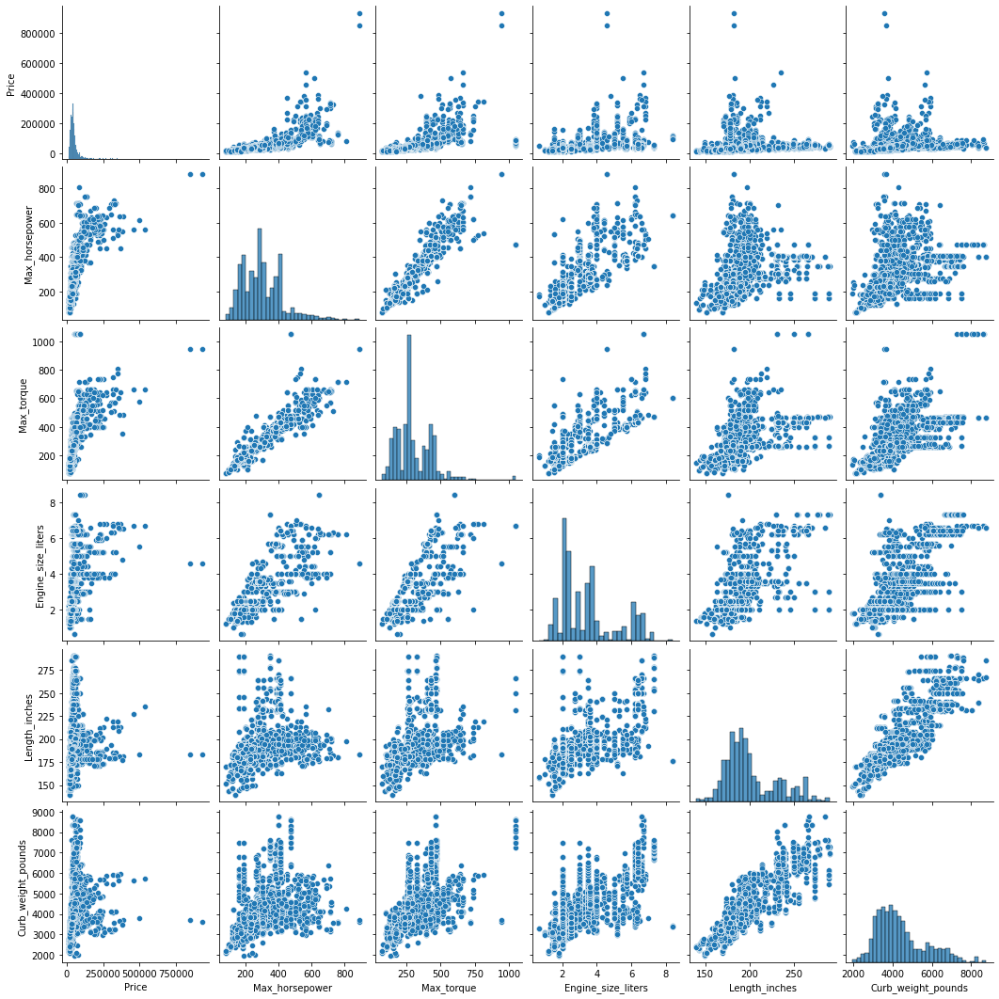

In [19]:
sns.pairplot(df[['Price', 'Max_horsepower', 'Max_torque', 'Engine_size_liters', 'Length_inches', 'Curb_weight_pounds']])

# Multi-linear Regression

## Check label skewness
For Multi-linear Regression, the model must meet the assumption that numeric variables (especially the _label_, or target variable) follow a normal distribution.

[Skewness](https://en.wikipedia.org/wiki/Skewness) tests how far a distribution leans to one side or another. Right-tailed, or _postive_ skewness indicates a heavy concentration on the left end of the distribution and a long right tail. Left-tailed, or _negative_ skewness is the opposite.

For skewness to be considered _normal_ (that is, bell-shaped, with a roughly centered main grouping and symmetrical tails on the right and left ends), it must fall within the range -1 to 1.


For more info on what can be done with skewed distributions, see: [Generalized Linear Models](https://en.wikipedia.org/wiki/Linear_regression#Generalized_linear_models) on Wikipedia's Linear Regression page.

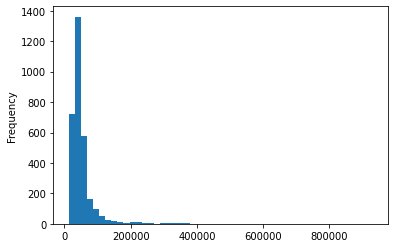

In [19]:
df['Price'].plot(kind='hist', bins=50)

This distribution is heavily right-skewed: most data points fall at the left end of the spectrum, with a few super-high prices at the far right end.

In [20]:
df['Price'].skew()

7.288841710505651

In [21]:
# Create a natural log transformation to reduce the higher prices at the right end
df['Price_log'] = np.log(df['Price'])
df['Price_log'].skew()

1.1797010518783628

Very close...it looks like the logarithmic transformation got the skewness almost within the acceptable range. Let's look at the distribution.

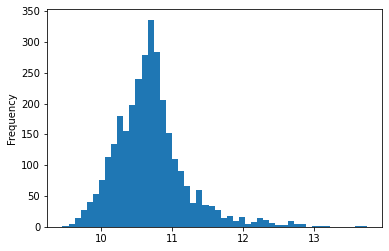

In [22]:
df['Price_log'].plot(kind='hist', bins=50)

## Dummy-code categorical variables
Also called "one-hot" encoding, dummy coding replaces the text values of categorical variables with new binary columns, with the number of new columns equal to $n-1$, where $n$ is the number of unique values in a categorical column. 

MLR requires numerical, not text, data, so this method enables the MLR model to use categorical columns to enhance the model's accuracy.

**Columns to exclude from the MLR model**
* Trim_ID (unique for every row)
* Year (the data comes from the latest model year available, so year shouldn't be a critical factor in this analysis)
* Model (500 unique values)
* Style (646 unique values)
* Trim (3064 unique values)
* Engine (84 unique values) 
* Price (since `Price_log` will be used instead)

**Columns to dummy-code**
* Make (44 unique values)
* Body_style (8 unique values)
* Origin (3 unique values)
* Drivetrain (4 unique values)
* Transmission_gears (8 unique values)
* Seating_capacity (11 unique values)
* Transmission_type (4 unique values)
* Same_size_wheels (2 unique values)

**Total columns added: 76** (84 unique values minus 8 variables)

**Columns to convert to `dtype: obj` first**
* Seating_capacity (numerical values, but represent categories since the number of seats is discrete rather than continuous)
* Transmission_gears (numerical values, but represent categories since the number of transmission gears is discrete rather than continuous)

In [23]:
# Check the number of unique values in each column
print('Column: Number of unique values\n', 
      '-------------------------------', sep='')
for col in df:
    print(col, ': ', len(df[col].unique()), sep='')

Column: Number of unique values
-------------------------------
Trim_ID: 3088
Make: 44
Model: 500
Year: 15
Style: 646
Trim: 3064
Body_style: 8
Origin: 3
Price: 2445
Drivetrain: 4
Engine: 84
Engine_size_liters: 51
Max_horsepower: 259
Max_torque: 236
Transmission_type: 4
Transmission_gears: 8
Fuel_capacity_gallons: 124
Wheelbase_inches: 245
Length_inches: 411
Width_inches: 146
Height_inches: 340
Same_size_wheels: 2
Seating_capacity: 11
Curb_weight_pounds: 1464
Price_log: 2445


In [24]:
# Examine data types of each column, to note which categorical columns
# need to be cast as 'object' (text) type
df.dtypes

Trim_ID                    int64
Make                      object
Model                     object
Year                       int64
Style                     object
Trim                      object
Body_style                object
Origin                    object
Price                    float64
Drivetrain                object
Engine                    object
Engine_size_liters       float64
Max_horsepower           float64
Max_torque               float64
Transmission_type         object
Transmission_gears       float64
Fuel_capacity_gallons    float64
Wheelbase_inches         float64
Length_inches            float64
Width_inches             float64
Height_inches            float64
Same_size_wheels            bool
Seating_capacity           int64
Curb_weight_pounds       float64
Price_log                float64
dtype: object

In [25]:
# Make a copy of the DataFrame for use with the MLR model
df_MLR = df.copy()

# Optional: set Trim_ID as the index
df_MLR.set_axis(df_MLR['Trim_ID'], inplace=True)
df_MLR.drop(columns=['Trim_ID'], inplace=True)

# Change data type of the Year, Transmission_gears, and Seating_capacity columns to text ('object')
# See: https://www.kite.com/python/answers/how-to-change-the-data-type-of-columns-in-a-pandas-dataframe-in-python
df_MLR = df_MLR.astype({'Transmission_gears': 'object', 'Seating_capacity': 'object'})

# Remove certain columns from the MLR model
include_cols = [col for col in list(df_MLR.columns) if col not in ['Year', 'Model', 'Style', 'Trim', 'Engine', 'Price']]

# Dummy-code selected categorical variables
dummy_cols = ['Make', 'Body_style', 'Origin', 'Drivetrain', 
              'Transmission_gears', 'Seating_capacity', 'Transmission_type', 
              'Same_size_wheels']

df_MLR = pd.get_dummies(data=df_MLR[include_cols], columns=dummy_cols, drop_first=True)

# View the shape of the MLR dataset
print('Rows:\t', len(df_MLR.index), '\nCols:\t', len(df_MLR.columns), '\n', sep='')
df_MLR.head()

Rows:	3088
Cols:	86



,Engine_size_liters,Max_horsepower,Max_torque,Fuel_capacity_gallons,Wheelbase_inches,Length_inches,Width_inches,Height_inches,Curb_weight_pounds,Price_log,Make_Alfa Romeo,Make_Aston Martin,Make_Audi,Make_BMW,Make_Bentley,Make_Buick,Make_Cadillac,Make_Chevrolet,Make_Chrysler,Make_Dodge,Make_Ferrari,Make_Fiat,Make_Ford,Make_GMC,Make_Genesis,Make_Honda,Make_Hyundai,Make_Infiniti,Make_Jaguar,Make_Jeep,Make_Karma,Make_Kia,Make_Lamborghini,Make_Land Rover,Make_Lexus,Make_Lincoln,Make_Lotus,Make_Maserati,Make_Mazda,Make_McLaren,...,Make_Porsche,Make_Ram,Make_Rolls-Royce,Make_Subaru,Make_Toyota,Make_Volkswagen,Make_Volvo,Body_style_coupe,Body_style_hatchback,Body_style_pickup,Body_style_sedan,Body_style_station wagon,Body_style_suv,Body_style_van,Origin_foreign,Origin_unknown,Drivetrain_Four Wheel Drive,Drivetrain_Front Wheel Drive,Drivetrain_Rear Wheel Drive,Transmission_gears_4.0,Transmission_gears_5.0,Transmission_gears_6.0,Transmission_gears_7.0,Transmission_gears_8.0,Transmission_gears_9.0,Transmission_gears_10.0,Seating_capacity_2,Seating_capacity_3,Seating_capacity_4,Seating_capacity_5,Seating_capacity_6,Seating_capacity_7,Seating_capacity_8,Seating_capacity_10,Seating_capacity_12,Seating_capacity_15,Transmission_type_Automatic,Transmission_type_CVT,Transmission_type_Manual,Same_size_wheels_True
Trim_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
419574,3.5,290.0,267.0,18.5,113.8,198.4,78.7,67.1,4529.0,10.914088,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1
419576,3.5,290.0,267.0,18.5,113.8,198.4,78.7,67.1,4565.0,11.034809,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1
419573,3.5,290.0,267.0,18.5,113.8,198.4,78.7,67.1,4503.0,10.824666,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1
419575,3.5,290.0,267.0,18.5,113.8,198.4,78.7,67.1,4534.0,10.975841,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1
419577,3.5,290.0,267.0,18.5,113.8,198.4,78.7,67.1,4271.0,10.784047,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1


## Normalize values using a Min-Max scale
This isn't necessary for MLR models, but it makes the coefficients comparable.

In [26]:
# Manual method
df_minmax = df_MLR.copy()

for col in df_minmax:
    minVal = df_minmax[col].min()
    maxVal = df_minmax[col].max()
    df_minmax[col] = (df_minmax[col] - minVal) / (maxVal - minVal)

df_minmax.head()

,Engine_size_liters,Max_horsepower,Max_torque,Fuel_capacity_gallons,Wheelbase_inches,Length_inches,Width_inches,Height_inches,Curb_weight_pounds,Price_log,Make_Alfa Romeo,Make_Aston Martin,Make_Audi,Make_BMW,Make_Bentley,Make_Buick,Make_Cadillac,Make_Chevrolet,Make_Chrysler,Make_Dodge,Make_Ferrari,Make_Fiat,Make_Ford,Make_GMC,Make_Genesis,Make_Honda,Make_Hyundai,Make_Infiniti,Make_Jaguar,Make_Jeep,Make_Karma,Make_Kia,Make_Lamborghini,Make_Land Rover,Make_Lexus,Make_Lincoln,Make_Lotus,Make_Maserati,Make_Mazda,Make_McLaren,...,Make_Porsche,Make_Ram,Make_Rolls-Royce,Make_Subaru,Make_Toyota,Make_Volkswagen,Make_Volvo,Body_style_coupe,Body_style_hatchback,Body_style_pickup,Body_style_sedan,Body_style_station wagon,Body_style_suv,Body_style_van,Origin_foreign,Origin_unknown,Drivetrain_Four Wheel Drive,Drivetrain_Front Wheel Drive,Drivetrain_Rear Wheel Drive,Transmission_gears_4.0,Transmission_gears_5.0,Transmission_gears_6.0,Transmission_gears_7.0,Transmission_gears_8.0,Transmission_gears_9.0,Transmission_gears_10.0,Seating_capacity_2,Seating_capacity_3,Seating_capacity_4,Seating_capacity_5,Seating_capacity_6,Seating_capacity_7,Seating_capacity_8,Seating_capacity_10,Seating_capacity_12,Seating_capacity_15,Transmission_type_Automatic,Transmission_type_CVT,Transmission_type_Manual,Same_size_wheels_True
Trim_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
419574,0.367742,0.262052,0.197746,0.264706,0.203493,0.389146,0.478916,0.332374,0.375045,0.340674,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
419576,0.367742,0.262052,0.197746,0.264706,0.203493,0.389146,0.478916,0.332374,0.380350,0.368789,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
419573,0.367742,0.262052,0.197746,0.264706,0.203493,0.389146,0.478916,0.332374,0.371213,0.319848,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
419575,0.367742,0.262052,0.197746,0.264706,0.203493,0.389146,0.478916,0.332374,0.375782,0.355056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
419577,0.367742,0.262052,0.197746,0.264706,0.203493,0.389146,0.478916,0.332374,0.337025,0.310388,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


In [27]:
# Using sklearn
from sklearn.preprocessing import MinMaxScaler

df_minmax2 = pd.DataFrame(
    data = MinMaxScaler().fit_transform(df_MLR), 
    columns = df_MLR.columns)

df_minmax2.head()

,Engine_size_liters,Max_horsepower,Max_torque,Fuel_capacity_gallons,Wheelbase_inches,Length_inches,Width_inches,Height_inches,Curb_weight_pounds,Price_log,Make_Alfa Romeo,Make_Aston Martin,Make_Audi,Make_BMW,Make_Bentley,Make_Buick,Make_Cadillac,Make_Chevrolet,Make_Chrysler,Make_Dodge,Make_Ferrari,Make_Fiat,Make_Ford,Make_GMC,Make_Genesis,Make_Honda,Make_Hyundai,Make_Infiniti,Make_Jaguar,Make_Jeep,Make_Karma,Make_Kia,Make_Lamborghini,Make_Land Rover,Make_Lexus,Make_Lincoln,Make_Lotus,Make_Maserati,Make_Mazda,Make_McLaren,...,Make_Porsche,Make_Ram,Make_Rolls-Royce,Make_Subaru,Make_Toyota,Make_Volkswagen,Make_Volvo,Body_style_coupe,Body_style_hatchback,Body_style_pickup,Body_style_sedan,Body_style_station wagon,Body_style_suv,Body_style_van,Origin_foreign,Origin_unknown,Drivetrain_Four Wheel Drive,Drivetrain_Front Wheel Drive,Drivetrain_Rear Wheel Drive,Transmission_gears_4.0,Transmission_gears_5.0,Transmission_gears_6.0,Transmission_gears_7.0,Transmission_gears_8.0,Transmission_gears_9.0,Transmission_gears_10.0,Seating_capacity_2,Seating_capacity_3,Seating_capacity_4,Seating_capacity_5,Seating_capacity_6,Seating_capacity_7,Seating_capacity_8,Seating_capacity_10,Seating_capacity_12,Seating_capacity_15,Transmission_type_Automatic,Transmission_type_CVT,Transmission_type_Manual,Same_size_wheels_True
0,0.367742,0.262052,0.197746,0.264706,0.203493,0.389146,0.478916,0.332374,0.375045,0.340674,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,0.367742,0.262052,0.197746,0.264706,0.203493,0.389146,0.478916,0.332374,0.380350,0.368789,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,0.367742,0.262052,0.197746,0.264706,0.203493,0.389146,0.478916,0.332374,0.371213,0.319848,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,0.367742,0.262052,0.197746,0.264706,0.203493,0.389146,0.478916,0.332374,0.375782,0.355056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
4,0.367742,0.262052,0.197746,0.264706,0.203493,0.389146,0.478916,0.332374,0.337025,0.310388,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


## Create an MLR model using `statsmodels`


In [29]:
import statsmodels.api as sm

# Ordinary Least Squares function format: 
# sm.OLS(endog, exog, hasconst=True)
# endog = 'endogenous' variable, or 'y'
# exog = 'exogenous' variable, or 'x'

### Using non-normalized data
Remember, we applied a natural logarithmic transformation to `Price_log`. Therefore, to interpret the `Price_log` results you must raise $e^P$, where $P$ is the `Price_log` value. That will change the price back to dollars.

In [30]:
xvars = df_MLR.drop(columns=['Price_log']).assign(const=1)
yvar = df_MLR['Price_log']

MLR_model = sm.OLS(yvar, xvars, hasconst=True).fit()

print(MLR_model.summary())

                            OLS Regression Results                            
Dep. Variable:              Price_log   R-squared:                       0.922
Model:                            OLS   Adj. R-squared:                  0.920
Method:                 Least Squares   F-statistic:                     421.2
Date:                Sat, 13 Nov 2021   Prob (F-statistic):               0.00
Time:                        16:41:30   Log-Likelihood:                 1672.5
No. Observations:                3088   AIC:                            -3175.
Df Residuals:                    3003   BIC:                            -2662.
Df Model:                          84                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Engine_size_lite

### Using normalized data
This dataset has been transformed through Min-Max normalization, placing all values on a scale of 0-1. Therefore, the constants are comparable, meaning features with higher constants have more of an impact on `Price_log` than features with lower constants.

In [31]:
xvars = df_minmax.drop(columns=['Price_log']).assign(const=1)
yvar = df_minmax['Price_log']

MLR_model = sm.OLS(yvar, xvars, hasconst=True).fit()

print(MLR_model.summary())

                            OLS Regression Results                            
Dep. Variable:              Price_log   R-squared:                       0.922
Model:                            OLS   Adj. R-squared:                  0.920
Method:                 Least Squares   F-statistic:                     421.2
Date:                Sat, 13 Nov 2021   Prob (F-statistic):               0.00
Time:                        16:41:45   Log-Likelihood:                 6172.2
No. Observations:                3088   AIC:                        -1.217e+04
Df Residuals:                    3003   BIC:                        -1.166e+04
Df Model:                          84                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Engine_size_lite

### Omitting the `Make` dummy-coded columns
Reduces the model's Adjusted R-squared value from 0.920 to 0.847.

In [32]:
# Make a copy of the DataFrame for use with the MLR model
df_MLR2 = df.copy()

# Optional: set Trim_ID as the index
df_MLR2.set_axis(df_MLR2['Trim_ID'], inplace=True)
df_MLR2.drop(columns=['Trim_ID'], inplace=True)

# Change data type of the Year, Transmission_gears, and Seating_capacity columns to text ('object')
# See: https://www.kite.com/python/answers/how-to-change-the-data-type-of-columns-in-a-pandas-dataframe-in-python
df_MLR2 = df_MLR2.astype({'Transmission_gears': 'object', 'Seating_capacity': 'object'})

# Remove certain columns from the MLR model
include_cols = [col for col in list(df_MLR2.columns) if col not in ['Year', 'Make', 'Model', 'Style', 'Trim', 'Engine', 'Price']]

# Dummy-code selected categorical variables
dummy_cols = ['Body_style', 'Origin', 'Drivetrain', 
              'Transmission_gears', 'Seating_capacity', 'Transmission_type', 
              'Same_size_wheels']

df_MLR2 = pd.get_dummies(data=df_MLR2[include_cols], columns=dummy_cols, drop_first=True)

# View the shape of the MLR dataset
# print('Rows:\t', len(df_MLR2.index), '\nCols:\t', len(df_MLR2.columns), '\n', sep='')
# df_MLR2.head()

xvars = df_MLR2.drop(columns=['Price_log']).assign(const=1)
yvar = df_MLR2['Price_log']

MLR_model2 = sm.OLS(yvar, xvars, hasconst=True).fit()
print(MLR_model2.summary())

                            OLS Regression Results                            
Dep. Variable:              Price_log   R-squared:                       0.849
Model:                            OLS   Adj. R-squared:                  0.847
Method:                 Least Squares   F-statistic:                     407.3
Date:                Sat, 13 Nov 2021   Prob (F-statistic):               0.00
Time:                        16:42:02   Log-Likelihood:                 656.09
No. Observations:                3088   AIC:                            -1226.
Df Residuals:                    3045   BIC:                            -966.7
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Engine_size_lite

## Remove insignificant features
Remove features that have p-values greater than 0.05

In [33]:
# Create the model, using normalized data
df_reduced = df_minmax.copy()
xvars = df_reduced.drop(columns=['Price_log']).assign(const=1)
yvar = df_reduced['Price_log']

MLR_reduced = sm.OLS(yvar, xvars, hasconst=True).fit()

# Re-run the model and check p-values, removing the highest p-value until 
# there are no p-values greater than 0.05
threshold = 0.05

pvals = pd.Series(MLR_reduced.pvalues)

while pvals.max() > threshold:
    # find the highest p-value item
    # See: https://pandas.pydata.org/docs/reference/api/pandas.Series.idxmax.html
    highest_pval = pvals.idxmax()

    # drop that column
    df_reduced.drop(columns=[highest_pval], inplace=True)

    # run the model again
    yvar_reduced = df_reduced['Price_log']
    xvars_reduced = df_reduced.drop(columns=['Price_log']).assign(const=1)
    MLR_reduced = sm.OLS(yvar_reduced, xvars_reduced, hasconst=True).fit()

    # calculate the difference (r^2 minus adj. r^2)
    pvals = pd.Series(MLR_reduced.pvalues)
    rsq = MLR_reduced.rsquared
    rsq_adj = MLR_reduced.rsquared_adj
    rsq_diff = rsq - rsq_adj 

# model trimmed sufficiently, print results
print('Number of columns:', len(df_reduced.columns.values))
print('Number of features:', len(df_reduced.columns.values) - 1, '\n')
print('New model:')
print(MLR_reduced.summary())

Number of columns: 76
Number of features: 75 

New model:
                            OLS Regression Results                            
Dep. Variable:              Price_log   R-squared:                       0.922
Model:                            OLS   Adj. R-squared:                  0.920
Method:                 Least Squares   F-statistic:                     478.1
Date:                Sat, 13 Nov 2021   Prob (F-statistic):               0.00
Time:                        16:42:22   Log-Likelihood:                 6167.3
No. Observations:                3088   AIC:                        -1.218e+04
Df Residuals:                    3013   BIC:                        -1.173e+04
Df Model:                          74                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------

## Check model quality using fit metrics

In [34]:
# Review the quality of the model
def mlr_fit(mlr_model, actual):
    import numpy as np

    # the difference between actual values and estimated values
    residuals = np.array(actual) - np.array(mlr_model.fittedvalues)

    # the average of the absolute value of the residuals
    mean_abs_error = np.mean(abs(residuals))

    # RMSE: Root Mean Squared Error, the square root of the average of the summed squares of residuals
    rmse = np.sqrt(sum(residuals**2)/len(actual))

    # create a string holding the model quality metrics
    metrics  = 'R-squared:\t\t' + str(round(mlr_model.rsquared, 4)) + '\n'
    metrics += 'Adj. R-sq:\t\t' + str(round(mlr_model.rsquared_adj, 4)) + '\n'

    metrics += 'RMSE:\t\t\t' + str(round(rmse, 4)) + '\n'
    metrics += 'MAE:\t\t\t' + str(round(mean_abs_error, 4)) + '\n'
    metrics += 'Label mean:\t\t' + str(round(np.mean(actual), 4))

    return metrics

In [35]:
print(mlr_fit(MLR_reduced, df_reduced['Price_log']))

R-squared:		0.9215
Adj. R-sq:		0.9196
RMSE:			0.0328
MAE:			0.0249
Label mean:		0.2893


## Test for Multi-collinearity
This is the degree to which feature variables correlate with one another. The best model will have little overlap in feature variables.

Variance Inflation Factor (VIF) is a measure of how correlated a variable is with other variables in the regression. Lower numbers are better. <10 is acceptable, <5 is good, <3 is ideal. 

Tolerance is a related measure that describes association between variables. For tolerance scores (0-1 scale), higher is better. >0.1 is acceptable and >0.2 is ideal.

In [36]:
# Create a function to return a DataFrame with the VIF and tolerance for each variable

def vif(df, label):
    '''
    Returns a DataFrame with the Variance Inflation Factor (VIF)
    and Tolerance for each of the numeric variables in the input DataFrame.
    Uses the `sklearn.linear_model.LinearRegression` function to produce
    linear regressions of each feature variable against all other features.

    Parameters:
    ---
    * df: required. This is the input DataFrame, from which VIF and Tolerance
    will be calculated (based on numeric columns only).
    * label: required. This is the y-variable that is being predicted. It will
    be removed prior to computing VIF and Tolerance for the feature variables.
    
    Definitions:
    ---
    * VIF = 1/(1 - R^2), where R^2 is the r-squared 
    value generated by the regression model for each feature.
    Ranges: <3 is best, <5 is good, and <10 is acceptable
    * Tolerance: 1 - R^2, where R^2 is the r-squared
    value generated by the regression model for each 
    Ranges: >0.2 is preferred and >0.1 is acceptable
    '''
    import pandas as pd
    from sklearn.linear_model import LinearRegression

    # Create dictionaries to store VIF and Tolerance
    vif_dict, tolerance_dict = {}, {}

    # Remove the label (y variable) and non-numeric columns from the input DataFrame
    df_model = df.drop(columns=[label]).select_dtypes(include='number').copy()

    # Perform a linear regression on each numeric feature vs. all other features
    for col in df_model:
        yvar = df_model[col]
        xvars = df_model.drop(columns=[col])

        # Retrieve r-squared value from the linear regression
        r_squared = LinearRegression().fit(xvars, yvar).score(xvars, yvar)

        # Calculate VIF
        if r_squared < 1:   # prevent divide-by-zero errors if r^2 is 1
            vif = 1 / (1 - r_squared)
        else:
            vif = 10000   # an arbitrary, large number to indicate a poor VIF score
        vif_dict[col] = vif

        # Calculate tolerance
        tolerance = 1 - r_squared
        tolerance_dict[col] = tolerance

        # Create the output DataFrame
        df_output = pd.DataFrame({'VIF': vif_dict, 'Tolerance': tolerance_dict})

    # Return the output DataFrame, sorted by VIF in descending order
    return df_output.sort_values(by= ['VIF'], ascending= False)      

In [37]:
# Display full result set
# See: https://www.kite.com/python/answers/how-to-print-an-entire-pandas-dataframe-in-python
# Also: https://pandas.pydata.org/pandas-docs/stable/user_guide/options.html
std_row_limit = pd.options.display.max_rows     # 60 rows
pd.options.display.max_rows = None              # Unlimited

print(vif(df_reduced, 'Price_log'))

# Reset normal display truncation
pd.options.display.max_rows = std_row_limit

                                       VIF  Tolerance
Make_Ferrari                  10000.000000   0.000000
Make_Mini                     10000.000000   0.000000
Make_McLaren                  10000.000000   0.000000
Make_Aston Martin             10000.000000   0.000000
Make_Lotus                    10000.000000   0.000000
Origin_unknown                10000.000000   0.000000
Make_Karma                    10000.000000   0.000000
Length_inches                    45.230777   0.022109
Wheelbase_inches                 40.264464   0.024836
Transmission_gears_8.0           15.650178   0.063897
Body_style_pickup                14.427626   0.069311
Transmission_gears_6.0           13.925965   0.071808
Body_style_suv                   12.756034   0.078394
Curb_weight_pounds               11.334450   0.088227
Seating_capacity_5               11.023097   0.090719
Transmission_gears_10.0          10.908496   0.091672
Engine_size_liters                8.719482   0.114686
Transmission_type_CVT       

## Create an MLR model using `sklearn`

In [51]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

yvar = df_MLR['Price_log']
xvars = df_MLR.drop(columns=['Price_log'])

# Split the data into a training group (70% of rows) and a test group (30% of rows)
X_train, X_test, y_train, y_test = train_test_split(
    xvars, yvar, test_size=0.3, random_state=0)

# Fit the model
skl_MLR = LinearRegression().fit(X_train, y_train)

# View the r-squared value of the trained data
# To view r-sq of test data, simply run the score using X_test and y_test
print('R-squared: ', skl_MLR.score(X_train, y_train), '\n', sep='')

# Compare to actuals
df_comp = pd.DataFrame({'Actual': np.exp(y_test), 'Predicted': np.exp(skl_MLR.predict(X_test))})
df_comp['Residuals'] = abs(df_comp['Actual'] - df_comp['Predicted'])
print('Avg. error: ', round(df_comp['Residuals'].mean(), 0), sep='')
print('Median error: ', round(df_comp['Residuals'].median(), 0), '\n', sep='')
df_comp.sort_values(by=['Residuals'], ascending=True).head(10)

R-squared: 0.9235749247362903

Avg. error: 7298.0
Median error: 3549.0



,Actual,Predicted,Residuals
Trim_ID,,,
381925,21170.0,21172.133746,2.133746
423272,31925.0,31952.794905,27.794905
420058,53395.0,53425.485793,30.485793
425090,30320.0,30364.826213,44.826213
418707,37350.0,37294.153524,55.846476
385238,20990.0,20927.830336,62.169664
416026,32370.0,32303.533996,66.466004
419355,25795.0,25722.191020,72.808980
418011,44790.0,44699.240104,90.759896


# Decision Tree Classifier
A prediction model for categorical variables. I chose to predict two variables: `Origin` (a two-class type of either foreign or domestic) and `Body_style` (multi-class with 8 possible values).

Import packages for creating the Decision Tree model

In [52]:
# The DecisionTreeClassifier is used to create models for decision trees
from sklearn.tree import DecisionTreeClassifier

# The train_test_split function divides a dataset into two groups: 
# a training group, and a testing group
from sklearn.model_selection import train_test_split

# the metrics module has functions for producing accuracy scores of the models
from sklearn import metrics

## Two-class classifier: vehicle origin

Create Dummy Codes

Why are dummy codes needed for categorical variables? According to the [documentation on Decision Trees](https://scikit-learn.org/stable/modules/tree.html#tree) (from the `sklearn.tree` module), 
> Decision trees are "able to handle both numerical and categorical data. However scikit-learn implementation does not support categorical variables for now."


Scikit-Learn also has fantastic [Tutorials pages](https://scikit-learn.org/stable/tutorial/index.html) that demonstrate examples of processing data and training models.

In [74]:
# Create a new DataFrame for the Decision Tree model
# Drop the Price_log column, since it isn't necessary for the Decision Tree estimator
df_DT = df.drop(columns=['Price_log']).copy()

# Remove the 'unknown' origins, so we have a two-class category: domestic or foreign
df_DT = df_DT[df_DT['Origin'] != 'unknown']

# Remove certain columns from the Decision Tree model
# Year: most of this dataset comes from the latest-year vehicles, so there 
# shouldn't be much variation from that variable
# Model, Style, Trim, and Engine: I choose to remove this columns to reduce 
# dimensionality, since they would add hundreds of additional columns once dummy-coded
include_cols = [col for col in list(df_DT.columns) if col not in ['Year', 'Model', 'Style', 'Trim', 'Engine']]

# Dummy-code selected categorical variables
dummy_cols = ['Make', 'Body_style', 'Drivetrain', 'Transmission_type', 
              'Same_size_wheels']

# Note that we do not need to drop the first dummy column, as we do in Linear Regression,
# but we can still drop that column, since it has redundant information.
df_DT = pd.get_dummies(data=df_DT[include_cols], columns=dummy_cols, drop_first=False)

# View the shape of the dataset
print('Rows:\t', len(df_DT.index), '\nCols:\t', len(df_DT.columns), '\n', sep='')
# df_DT.head()

# Set X and Y variables
xvars = df_DT.drop(columns=['Origin'])
yvar = df_DT['Origin']

# Split data, using 70% as training data and 30% as test data
X_train, X_test, y_train, y_test = train_test_split(
    xvars, yvar, test_size=0.3, random_state=0)

# Create classifier model
clf = DecisionTreeClassifier(random_state=0)
clf = clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

# Compare predicted to actual values
comp_dict = {}
comp_dict['Actual'] = y_test
comp_dict['Predicted'] = y_pred
df_comp = pd.DataFrame(comp_dict)
print('Predicted: foreign, Actual: domestic')
print(df_comp.sort_values(by=['Actual', 'Predicted'], ascending=[True, False]).head(10))
print('\nPredicted: domestic, Actual: foreign')
print(df_comp.sort_values(by=['Actual', 'Predicted'], ascending=[False, True]).head(10))

Rows:	3043
Cols:	70

Predicted: foreign, Actual: domestic
        Actual Predicted
10    domestic   foreign
2506  domestic   foreign
2086  domestic   foreign
2884  domestic  domestic
2821  domestic  domestic
1604  domestic  domestic
782   domestic  domestic
1878  domestic  domestic
2867  domestic  domestic
2860  domestic  domestic

Predicted: domestic, Actual: foreign
       Actual Predicted
2027  foreign  domestic
22    foreign  domestic
162   foreign  domestic
2391  foreign  domestic
2990  foreign  domestic
503   foreign   foreign
1793  foreign   foreign
2295  foreign   foreign
2435  foreign   foreign
3081  foreign   foreign


### Fit metrics: how well did it do?
#### Accuracy

In [75]:
# Accuracy: the percent of outcomes labeled correctly
Acc = metrics.accuracy_score(y_true = y_test, y_pred = y_pred)

print('Accuracy: ', round(Acc, 3), '\n', sep='')

# Other fit metrics
df_report = pd.DataFrame(
    metrics.classification_report(
        y_true = y_test, 
        y_pred = y_pred, 
        output_dict = True
    )
)

df_report

Accuracy: 0.991



,domestic,foreign,accuracy,macro avg,weighted avg
precision,0.977876,0.995633,0.991238,0.986755,0.991277
recall,0.986607,0.992743,0.991238,0.989675,0.991238
f1-score,0.982222,0.994186,0.991238,0.988204,0.991251
support,224.000000,689.000000,0.991238,913.000000,913.000000


### Confusion matrix: graphical representation of model accuracy

In [62]:
# Import packages for producing confusion matix plots
# from sklearn import metrics

# for visualizing model quality
import matplotlib.pyplot as plt

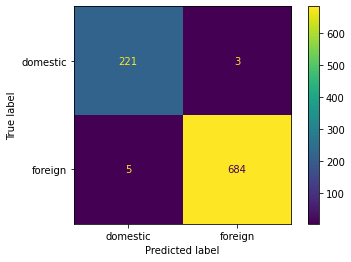

In [76]:
cm = metrics.confusion_matrix(
    y_true = y_test, 
    y_pred = y_pred
)

cm_display = metrics.ConfusionMatrixDisplay(
    confusion_matrix = cm, 
    display_labels = ['domestic', 'foreign']
)

# Plot the confusion matrix, with values shown in decimal form.
# Otherwise, the default display is scientific (exponential) notation.
cm_display.plot(values_format = 'd')

plt.show()

### Visualize the decision tree
Takes approximately 30 seconds to run in Google Colab. To reduce to 15 seconds, comment out the `plt.savefig(..)` line.

In [90]:
from sklearn import tree

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10,6), dpi=1200)

feature_names = list(xvars.columns)
category_names = sorted(list(yvar.unique()))

dec_tree = tree.plot_tree(
    decision_tree = clf, 
    feature_names = feature_names, 
    class_names = category_names, 
    filled = True
)

plt.savefig('Decision_tree_vehicle_origin.png', dpi='figure')
plt.show()

### Visualizing, alternate method
Takes approximately 10 seconds to run in Google Colab.

In [ ]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus, six

dot_data = StringIO()
export_graphviz(
    decision_tree = clf, 
    out_file = dot_data, 
    filled = True, 
    rounded = True, 
    special_characters = True, 
    feature_names = list(xvars.columns), 
    class_names = sorted(list(y_train.unique())) 
)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Decision_tree_vehicle_origin2.png')
Image(graph.create_png())

## Multi-class classifier: `Body_style`
Most of the code in this section is copied, with minor modifications, from the two-class classifier section.

In [91]:
# Create a new DataFrame for the Decision Tree model
# Drop the Price_log column, since it isn't necessary for the Decision Tree estimator
df_DT = df.drop(columns=['Price_log']).copy()

# Remove certain columns from the Decision Tree model
# Year: most of this dataset comes from the latest-year vehicles, so there 
# shouldn't be much variation from that variable
# Model, Style, Trim, and Engine: I choose to remove this columns to reduce 
# dimensionality, since they would add hundreds of additional columns once dummy-coded
include_cols = [col for col in list(df_DT.columns) if col not in ['Year', 'Model', 'Style', 'Trim', 'Engine']]

# Dummy-code selected categorical variables
dummy_cols = ['Make', 'Origin', 'Drivetrain', 'Transmission_type', 
              'Same_size_wheels']

# Note that we do not need to drop the first dummy column, as we do in Linear Regression,
# but we can still drop that column, since it has redundant information.
df_DT = pd.get_dummies(data=df_DT[include_cols], columns=dummy_cols, drop_first=False)

# View the shape of the dataset
print('Rows:\t', len(df_DT.index), '\nCols:\t', len(df_DT.columns), '\n', sep='')
# df_DT.head()

# Set X and Y variables
xvars = df_DT.drop(columns=['Body_style'])
yvar = df_DT['Body_style']

# Split data, using 70% as training data and 30% as test data
X_train, X_test, y_train, y_test = train_test_split(
    xvars, yvar, test_size=0.3, random_state=0)

# Create classifier model
clf = DecisionTreeClassifier(random_state=0)
clf = clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

# Compare predicted to actual values
comp_dict = {}
comp_dict['Actual'] = y_test
comp_dict['Predicted'] = y_pred
df_comp = pd.DataFrame(comp_dict)

df_comp.sort_values(by=['Actual', 'Predicted'], ascending=[True, False]).head(10)

Rows:	3088
Cols:	71



,Actual,Predicted
2933,convertible,sedan
196,convertible,sedan
193,convertible,sedan
250,convertible,sedan
249,convertible,sedan
2382,convertible,coupe
2737,convertible,coupe
3348,convertible,coupe
264,convertible,coupe
2114,convertible,coupe


### Fit metrics: how well did it do?
#### Accuracy

In [92]:
# Accuracy: the percent of outcomes labeled correctly
Acc = metrics.accuracy_score(y_true = y_test, y_pred = y_pred)

print('Accuracy: ', round(Acc, 3), '\n', sep='')

# Other fit metrics
df_report = pd.DataFrame(
    metrics.classification_report(
        y_true = y_test, 
        y_pred = y_pred, 
        output_dict = True
    )
)

df_report

Accuracy: 0.955



,convertible,coupe,hatchback,pickup,sedan,station wagon,suv,van,accuracy,macro avg,weighted avg
precision,0.725000,0.862500,0.854167,1.0,0.932927,1.000000,0.996540,0.989691,0.954693,0.920103,0.954922
recall,0.707317,0.831325,0.911111,1.0,0.974522,0.764706,0.989691,0.989691,0.954693,0.896045,0.954693
f1-score,0.716049,0.846626,0.881720,1.0,0.953271,0.866667,0.993103,0.989691,0.954693,0.905891,0.954364
support,41.000000,83.000000,45.000000,196.0,157.000000,17.000000,291.000000,97.000000,0.954693,927.000000,927.000000


### Confusion matrix: graphical representation of model accuracy

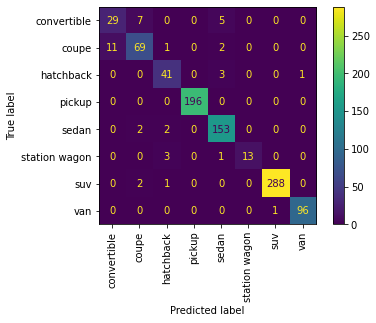

In [119]:
cm = metrics.confusion_matrix(
    y_true = y_test, 
    y_pred = y_pred
)

# Note that display_labels are given in alphabetical order
cm_display = metrics.ConfusionMatrixDisplay(
    confusion_matrix = cm, 
    display_labels = sorted(list(y_test.unique())) 
)

# Plot the confusion matrix, with values shown in decimal form.
# Otherwise, the default display is scientific (exponential) notation.
cm_display.plot(xticks_rotation=90, values_format = 'd')

plt.show()

In [117]:
# Verify that labels are correct when placed in alphabetical order
# Answer: yes! They should be in alphabetical order
# These are the True labels (y-axis)
y_test.value_counts().sort_index()

convertible       41
coupe             83
hatchback         45
pickup           196
sedan            157
station wagon     17
suv              291
van               97
Name: Body_style, dtype: int64

In [118]:
# These are the Predicted labels (x-axis)
pd.Series(y_pred).value_counts().sort_index()

convertible       40
coupe             80
hatchback         48
pickup           196
sedan            164
station wagon     13
suv              289
van               97
dtype: int64

### Visualize the decision tree
Takes approximately 40 seconds to run in Google Colab. To reduce to 25 seconds, comment out the `plt.savefig(..)` line.

In [141]:
# from sklearn import tree

# For figure size, see these helpful resources:
# https://stackabuse.com/change-figure-size-in-matplotlib/
# https://matplotlib.org/devdocs/gallery/subplots_axes_and_figures/figure_size_units.html
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,8), dpi=1200)

feature_names = list(X_train.columns)
# This is the list of category names in asceding alphabetical order,
# which is required by the tree.plot(class_names=..) parameter
category_names = sorted(list(y_train.unique()))

dec_tree = tree.plot_tree(
    decision_tree = clf, 
    feature_names = feature_names, 
    class_names = category_names, 
    filled = True
)

plt.savefig('Decision_tree_body_style.png', dpi='figure')
plt.show()

### Visualizing, alternate method
Takes approximately 16 seconds to run in Google Colab.

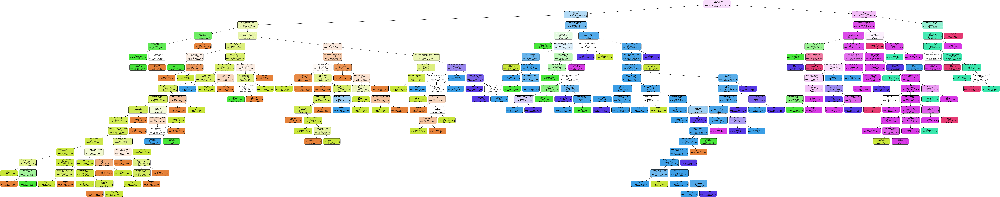

In [142]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus, six

dot_data = StringIO()
export_graphviz(
    decision_tree = clf, 
    out_file = dot_data, 
    filled = True, 
    rounded = True, 
    special_characters = True, 
    feature_names = list(xvars.columns), 
    class_names = sorted(list(y_train.unique())) 
)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Decision_tree_body_style2.png')
Image(graph.create_png())

# Clustering
A unsupervised method to find categories in the dataset. _Unsupervised_ means that I don't select a label to predict, but allow the model to generate labels (categories) for the data.

First, import the needed packages

In [143]:
# An agglomerative cluster is appropriate for this dataset due to its mixed datatypes and scales
from sklearn.cluster import AgglomerativeClustering

# The gower algorithm is a good method to create a distance matrix with mixed data types
!pip install gower
import gower

  Created wheel for gower: filename=gower-0.0.5-py3-none-any.whl size=4231 sha256=d31123fc9bf427f2070a977c00fc4f8550e1f2ddf5db8b12c38c72b6da505639
  Stored in directory: /root/.cache/pip/wheels/3e/f9/9a/67122a959a424e9cbb4557a8366c871a30e31cd75f0d003db4
Successfully built gower


Next, create the distance matrix. Takes about 20 seconds.

In [164]:
# Create a copy of the DataFrame for use with the clustering model
df_cluster = df.drop(columns=['Price_log', 'Trim_ID'])

# Create a distance matrix using the gower method
distance_matrix = gower.gower_matrix(df_cluster)

# View distance matrix, where each row is compared to all others
pd.DataFrame(distance_matrix).shape

(3088, 3088)

Fit the `AgglomerativeClustering` estimator

In [176]:
# Precomputed affinity tells the AgglomerativeClustering  model
# that the data received is a Gower distance matrix rather than
# a pandas DataFrame

# linkage tells the model how to evaluate the differences between clusters
# See: https://scikit-learn.org/stable/auto_examples/cluster/plot_linkage_comparison.html

agg = AgglomerativeClustering(n_clusters = 8, affinity='precomputed', linkage='average').fit(distance_matrix)

# add the assigned cluster to each record
df_cluster['Cluster'] = agg.labels_

# See number of assigned clusters
df_cluster['Cluster'].value_counts()

0    1848
5     831
1     242
2     110
3      27
7      13
4      12
6       5
Name: Cluster, dtype: int64

In [177]:
# Group by the clusters and examine the means by column
df_groups = df_cluster.groupby(by=['Cluster']).mean()

# Transpose so the columns are rows and the clusters are columns
df_groups = df_groups.transpose()

# df_groups['Diff'] = abs(df_groups[0] - df_groups[1])
# df_groups.sort_values(by=['Diff'], ascending=False, inplace=True)

df_groups

Cluster,0,1,2,3,4,5,6,7
Year,2019.381494,2019.739669,2018.827273,2019.074074,2015.750000,2021.440433,2021.00,2012.307692
Price,38778.927489,117938.268595,57124.227273,245903.518519,339084.166667,50781.101083,77778.00,26753.846154
Engine_size_liters,2.588149,3.736777,4.021818,4.655556,6.691667,5.110590,1.16,1.600000
Max_horsepower,239.554654,456.648760,395.063636,611.592593,526.166667,346.399519,391.80,164.384615
Max_torque,240.128788,441.954545,357.118182,518.185185,682.500000,396.114320,406.60,158.307692
Transmission_gears,6.406926,7.842975,6.290909,7.037037,6.666667,8.441637,1.00,6.000000
Fuel_capacity_gallons,16.810823,19.110331,16.416364,20.344444,24.650000,31.462575,7.04,12.538462
Wheelbase_inches,110.385087,111.617355,104.437273,107.714815,128.233333,153.145487,115.12,98.230769
Length_inches,186.392359,189.698760,177.102727,183.518519,215.441667,243.059230,182.92,150.030769
Width_inches,73.457305,74.853306,73.048182,76.229630,77.116667,81.173718,74.94,66.607692


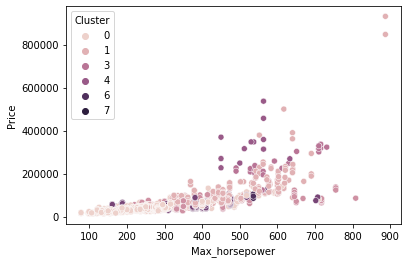

In [179]:
sns.scatterplot(x=df_cluster['Max_horsepower'], y=df_cluster['Price'], hue=df_cluster['Cluster'])